In [92]:
import numpy as np
from scipy.signal import hann, welch
from scipy.stats import chi2
from astropy.io import votable
from image_stack import ImageStack

%matplotlib inline 
from matplotlib import pyplot as plt

In [93]:
"""
colourblind-safe colours
"""
COLORS = (
    '#000000',
    '#0072b2',
    '#56b4e9',
    '#009e73',
    '#cc79a7',
    '#d55e00',
    '#e69f00',
    '#f0e442')

cm = plt.get_cmap('cubehelix')
print cm(0.5)

(0.6328422475018423, 0.4747981096220677, 0.29070209208025455, 1.0)


(0.0, 8.0, 0.0, 9.0)

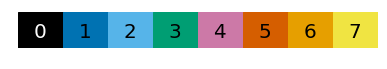

In [94]:
fig = plt.figure(figsize=[5, 0.5])
ax = fig.add_axes([0, 0, 1, 1])
import matplotlib.patches as mpatch
N=len(COLORS)
for j in range(len(COLORS)):
    ax.axvspan(j, j+1, color=COLORS[j])
    #r1 = mpatch.Rectangle((0, j), 1, 1, color='black')
    if j==0:
        txt = ax.text(j+.35, 4, j, va='center', fontsize=20, color='white')
    else:
        txt = ax.text(j+.35, 4,  j, va='center', fontsize=20)
    ax.set_xlim(0, 8)
ax.set_ylim(0, j + 2)
ax.axis('off')

In [24]:
FREQ="121-132"
TABLE_NAME = 'dr2_apparent_grouped.vot'

In [25]:
tab = votable.parse_single_table(TABLE_NAME)
print tab.fields

[<FIELD ID="Source_name_tgss" arraysize="24" datatype="char" name="Source_name_tgss"/>, <FIELD ID="GLEAM" arraysize="14" datatype="char" name="GLEAM"/>, <FIELD ID="obsid" arraysize="*" datatype="char" name="obsid"/>, <FIELD ID="ra" datatype="double" name="ra_scint"/>, <FIELD ID="dec" datatype="double" name="dec_scint"/>, <FIELD ID="elongation" datatype="double" name="elongation" unit="deg"/>, <FIELD ID="nsi" datatype="double" name="nsi"/>, <FIELD ID="err_nsi" datatype="double" name="err_nsi"/>, <FIELD ID="Fp162" datatype="double" name="Fp162"/>, <FIELD ID="alpha" datatype="double" name="alpha"/>, <FIELD ID="e_alpha" datatype="double" name="e_alpha"/>, <FIELD ID="peaked" datatype="boolean" name="peaked"/>, <FIELD ID="gps" datatype="boolean" name="gps"/>, <FIELD ID="peak_below_72mhz" datatype="boolean" name="peak_below_72mhz"/>, <FIELD ID="convex" datatype="boolean" name="convex"/>, <FIELD ID="flat" datatype="boolean" name="flat"/>, <FIELD ID="unclassified" datatype="boolean" name="uncla

In [55]:
t = tab.to_table().as_array()
N=len(t)
snr = t['nsi'] /  t['err_nsi']

In [56]:
imstacks = {}
for o in set(t['obsid']):
    imstacks[o] = ImageStack("../%s.hdf5" % o, freq=FREQ)

In [96]:
sources = sorted(set(t[names['Source_name_tgss']]))
obsids = sorted(set(t[names['obsid']]))
print obsids

['1147217904', '1147218200', '1147223904', '1147224200', '1147307352', '1147313992', '1147314288', '1147393800', '1147400392', '1147400688', '1147479952', '1147480248', '1147486800', '1147487096']


In [79]:
def get_ts(imstack, ra, dec, offset=5, out_slice=slice(8, -7)):
    """
    given imstack and coordinates return timeseries and list of 4 off-source time series
    """
    x, y = imstack.world2pix(ra, dec)
    ts = imstack.pix2ts(x, y)[out_slice]
    ts_noise = [imstack.pix2ts(x+j, y+k)[out_slice] 
                for j, k in ((offset, offset,), (offset, -offset), (-offset, offset), (-offset, -offset))]
    return ts, ts_noise

def get_ps(ts, ts_noise, fft_window=48, fs=2.0):
    """
    generate frequencies, power spectrum and noise power spectrum
    skip Nyquist channel
    """
    mean_ts = np.mean(ts)
    f, ps_on = welch(ts/mean_ts, fs=fs, window='hanning', nperseg=fft_window, detrend='constant')
    n_noise = len(ts_noise)
    ps_noise = sum([welch(ts_noise[i]/mean_ts, fs=2., window='hanning', nperseg=FFT_WINDOW, detrend='constant')[1] 
                       for i in range(n_noise)])/float(n_noise)
    return f[:-1], ps_on[:-1], ps_noise[:-1]
    

50
TGSSADR J000130.9+110140
TGSSADR J000401.5+060730
TGSSADR J000613.8-062334
TGSSADR J000622.5-000425
TGSSADR J000829.3-055845
TGSSADR J001310.7+005137
TGSSADR J001401.6+054510
TGSSADR J001425.4-020557
TGSSADR J001452.4+135956
TGSSADR J001625.0+133111
TGSSADR J001847.7-023350
TGSSADR J001855.2+094005
TGSSADR J001931.5-043547
TGSSADR J002021.7-023308
TGSSADR J002025.2+154052
TGSSADR J002050.3-085734
TGSSADR J002125.4-005540
TGSSADR J002212.4+112042
TGSSADR J002223.0-070235
TGSSADR J002225.4+001456
TGSSADR J002319.8+042850


/usr/local/lib/python2.7/dist-packages/matplotlib/pyplot.py:516: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


TGSSADR J002549.1-260210
TGSSADR J002712.4+125158
TGSSADR J002739.3+005952
TGSSADR J002751.0+032228
TGSSADR J002833.3+005510
TGSSADR J002922.6-111151
TGSSADR J003147.6+215346
TGSSADR J003200.9-085137
TGSSADR J003207.9+013655
TGSSADR J003238.3+195353
TGSSADR J003253.8+061910
TGSSADR J003314.8+062815
TGSSADR J003354.6-073023
TGSSADR J003508.8-200400
TGSSADR J003537.5+042739
TGSSADR J003606.4+183759
TGSSADR J003623.7+100757
TGSSADR J003627.0+001302
TGSSADR J003636.9+080008
TGSSADR J003704.0-010909
TGSSADR J003803.3+043651
TGSSADR J003817.9+122731
TGSSADR J003820.3-020740
TGSSADR J003834.6+045049
TGSSADR J003952.0+045531
TGSSADR J004050.3+100322
TGSSADR J004125.9-014315
TGSSADR J004243.0+124657
TGSSADR J004317.6+173158
TGSSADR J004333.8+064149
TGSSADR J004343.2-033144
TGSSADR J004354.4-160450
TGSSADR J004450.8+111740
TGSSADR J004523.1+134003
TGSSADR J004606.7-004343
TGSSADR J004630.6-000532
TGSSADR J004641.4+110251
TGSSADR J004644.4-052201
TGSSADR J004945.2-024259
TGSSADR J004954.1-100614


/usr/local/lib/python2.7/dist-packages/matplotlib/scale.py:101: RuntimeWarning: invalid value encountered in less_equal
  a[a <= 0.0] = 1e-300


TGSSADR J024658.7-133122
TGSSADR J024822.7-225758
TGSSADR J024935.4-075921
TGSSADR J234058.0+043114
TGSSADR J235025.3-022443
TGSSADR J235705.8-022632


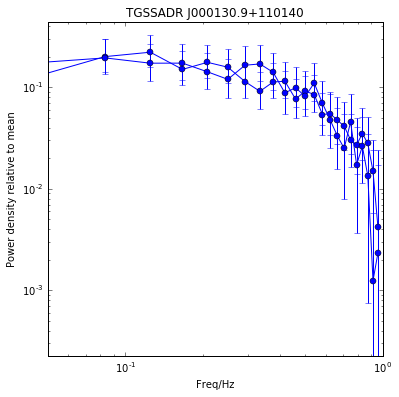

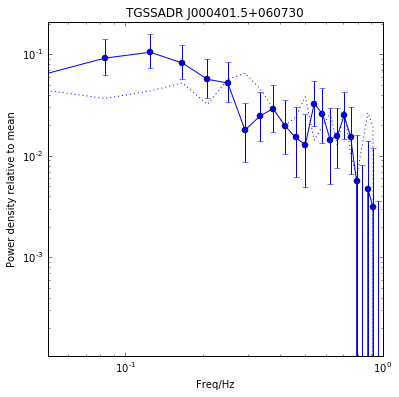

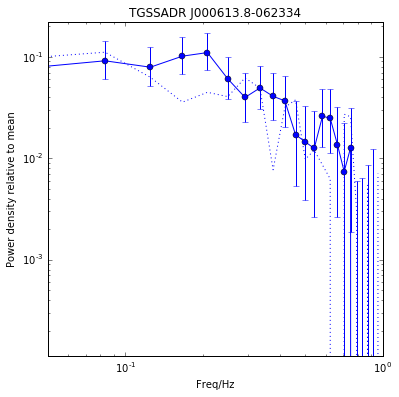

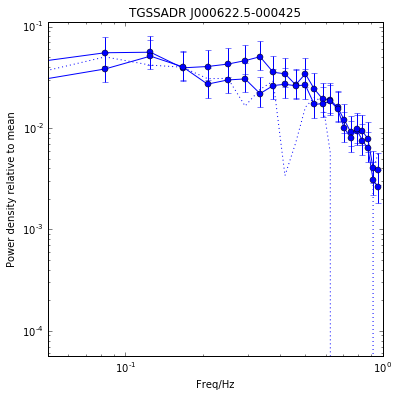

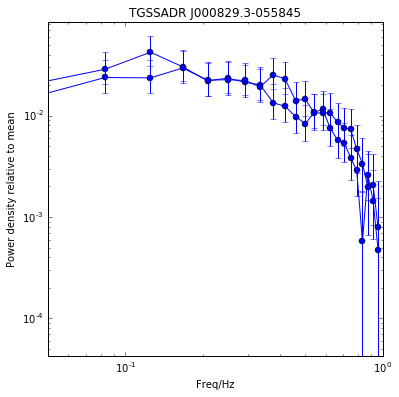

...

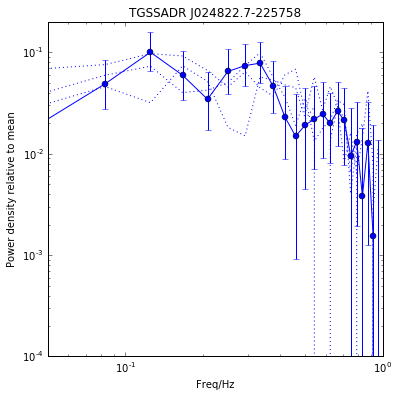

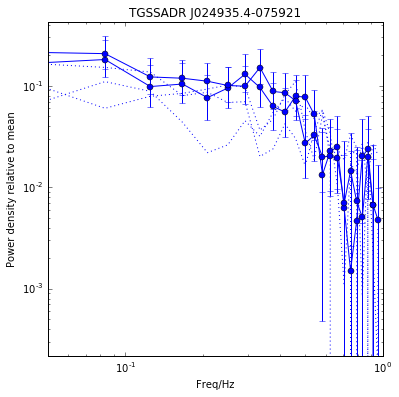

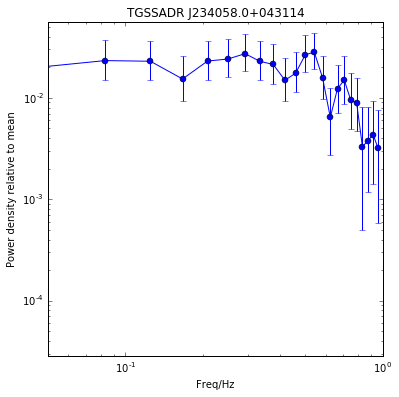

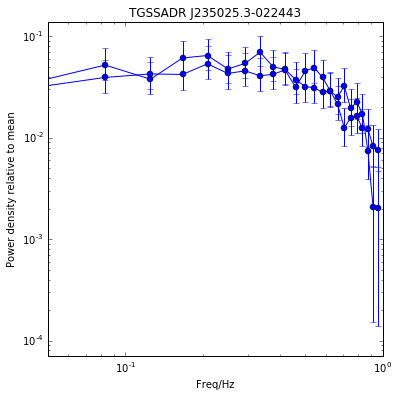

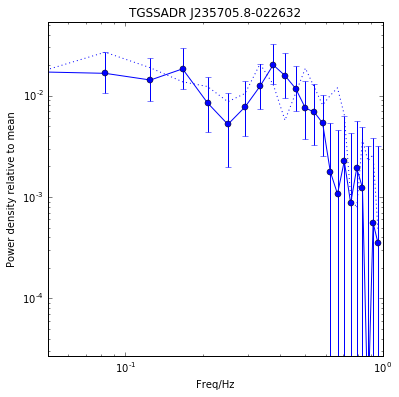

In [91]:
FFT_WINDOW=48
SNR_CUTOFF = 20
CMES = ['1147479952','1147480248']
n_dof = 2*(2*576//FFT_WINDOW+1)
print n_dof
for s, source in enumerate(sources):
    #source_bool = (t['Source_name_tgss'] == source) & (snr > SNR_CUTOFF)
    source_bool = (t['Source_name_tgss'] == source)
    if sum((source_bool) & (snr > SNR_CUTOFF)) == 0:
        continue
    #if sum(source_bool) == 0:
    #    continue
    print source

    source_snr = snr[source_bool]
    source_table = t[source_bool]
    plt.figure(figsize=(6.0, 6.0))
    plt.xscale('log')
    plt.yscale('log')
    p_max = 0
    for r, row in enumerate(source_table):
        ts, ts_noise = get_ts(imstacks[row['obsid']], row['ra'], row['dec'])
        f, ps_on, ps_noise = get_ps(ts, ts_noise, FFT_WINDOW)

        p = ps_on-ps_noise
        p_max = max(p_max, max(p))
        p_err = [ps_on*(1-n_dof/chi2.ppf(0.95, n_dof)), ps_on*(n_dof/chi2.ppf(0.05, n_dof) - 1)]
        color = 'blue' if not row['obsid'] in CMES else 'red'
        if source_snr[r] > SNR_CUTOFF:
            plt.errorbar(f, p, yerr=p_err, fmt='o-', color=color)
        else:
            plt.plot(f, p, ':', color=color)
    plt.xlim([0.05, 1.0])
    #plt.yscale('symlog', linthreshy=1e-3, nonposy='mask')
    plt.ylim([p_max*1e-3, 2*p_max])

    plt.title("%s" % source)
    plt.xlabel("Freq/Hz")
    plt.ylabel("Power density relative to mean")
    plt.savefig("%s_subtracted.png" % source)